# Convolution 3D sur images médicales : Covid et CT-scans

Nous importons les packages d'intérêt.

In [4]:
from typing import List, Tuple, Union

import os
import zipfile
import numpy as np

import tensorflow as tf
from tensorflow import keras

import numpy as np
# applications de transformations.
from scipy.ndimage.interpolation import map_coordinates
from scipy.ndimage.filters import gaussian_filter

Puis on réalise un point de montage avec le contenu de notre drive.

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive/')

## Chargement des données.

In [6]:
download = False

if download:
    # Scanners normaux.
    url = "https://github.com/hasibzunair/3D-image-classification-tutorial/releases/download/v0.2/CT-0.zip"
    filename = os.path.join('/content/gdrive/MyDrive/data', "CT-0.zip")
    tf.keras.utils.get_file(filename, url)

    # Scanners anormaux.
    url = "https://github.com/hasibzunair/3D-image-classification-tutorial/releases/download/v0.2/CT-23.zip"
    filename = os.path.join('/content/gdrive/MyDrive/data', "CT-23.zip")
    tf.keras.utils.get_file(filename, url)

    # On extrait les données dans le même dossier datasets/covid.
    os.makedirs(os.path.join('/content/gdrive/MyDrive/data/', 'covid'), exist_ok=True)
    with zipfile.ZipFile(os.path.join('/content/gdrive/MyDrive/data', "CT-0.zip"), "r") as z_fp:
        z_fp.extractall("/content/gdrive/MyDrive/data/")

    with zipfile.ZipFile(os.path.join('/content/gdrive/MyDrive/data', "CT-23.zip"), "r") as z_fp:
        z_fp.extractall("/content/gdrive/MyDrive/data/covid/")

else:
    print('Data already downloaded.')

Data already downloaded.


## Format DICOM

_Digital Imaging and COmmunications in Medicine_, couramment abrégée DICOM, est un standard pour la gestion informatique des données issues de l'imagerie médicale. Il a été créé en 1985 par l'_American College of Radiology_ et la _National Electric Manufacturers Association_ dans le but de standardiser les données transmises entre les différents appareils de radiologie. 

**L'objectif du standard DICOM est de faciliter les transferts d'images entre les machines de différents constructeurs. En effet, avant la généralisation de ce format, chaque constructeur de matériel d'imagerie utilisait un format de données propriétaire, entrainant d'importants problèmes de gestion et de maintenance (incompatibilités, coût, perte d'information) dans les établissements de santé.**

Une image au format DICOM est enregistrée sous forme de tableau de pixels avec les métadonnées associées. Les métadonnées comprennent des informations sur le patient, y compris le nom et la date de naissance. Les métadonnées comprennent également des informations sur l'image elle-même, telles que le nom de l'appareil utilisé pour acquérir l'image et certains paramètres d'imagerie.

Alors que plusieurs attributs DICOM dans les métadonnées doivent toujours être disponibles (par exemple le nom du patient), d'autres attributs DICOM sont uniques à un scanner ou à une machine particulière, ou propres à un type particulier d'imagerie, et peuvent donc ne pas être disponibles pour tous les fichiers DICOM. **Cela signifie que l'ensemble exact d'attributs disponibles dans un fichier DICOM particulier n'est pas garanti comme étant le même que les attributs d'un autre fichier DICOM.**

Ci-après sont exposés certains attributs standards particulièrement importants que l'on retrouve lors de la lecture d'image DICOM : le type d'image, l'orientation, la position, les paramètres servant à la conversion des intensités en HU (nous le verrons après), l'espace inter-pixels (distance physique en mm).

<img src="https://glassboxmedicine.files.wordpress.com/2021/02/dicomtable-1.png" width="600">



Malheureusement, les DICOM bruts ne peuvent pas être utilisés comme entrée directement pour les algorithmes d'apprentissage automatique. Les DICOM doivent d'abord être traités avant de pouvoir être analysés. Il existe différents _pipeline open-source_ de traitement qui permettent de passer des fichiers DICOM séparés (correspondant à différentes tranches d'un scanner) à un seul tableau numpy 3D compatible avec PyTorch, Tensorflow ou Keras. Voici l'une d'entre elles, particulièrement bien documentée : https://github.com/rachellea/ct-volume-preprocessing/blob/master/preprocess_volumes.py.

Dans les grandes lignes, voici les différentes étapes nécessaires au bon formattage des données DICOM :

- Empiler les tranches 2D du scanner dans le bon ordre;
- Vérifier à nouveau que le scanner est dans l'orientation souhaitée;
- Convertirles valeurs de pixel en unités Hounsfield (HU) en utilisant les attributs DICOM `RescaleSlope` et `RescaleIntercept`;
- Découper les valeurs de pixel à [-1000 HU, + 1000 HU], _i.e._ les limites inférieures et supérieures pratiques de l'échelle HU, correspondant respectivement aux radiodensités de l'air et de l'os;
- Utiliser `nibabel` ou `SimpleITK` pour rééchantillonner chaque volume à 0,8 x 0,8 x 0,8 mm pour permettre une signification de distance physique cohérente d'un pixel sur tous les patients;
- Convertir les valeurs de pixel en nombres entiers codés en 16 bits pour assurer la compression zip sans perte d'information tout en réduisant les besoins de stockage.

Nous n'aborderons pas la première étape puisque nos images sont par chance déjà bien alignées. Ceci étant, dans un fichier DICOM, l’attribut `ImageOrientationPatient` spécifie l’orientation du patient et est nécessaire pour déterminer quelle direction est la «direction z» (la direction de la tête aux pieds le long de laquelle les coupes axiales sont empilées). **En règle générale, les patients sont présentés dans l'orientation «1,0,0,0,1,0» pour un scanner thoracique, mais l'orientation est toujours importante à vérifier car elle peut parfois varier**.

Compte tenu de l'orientation du patient, il est possible de déterminer quelle valeur stockée dans l'attribut `ImagePositionPatient` est la position z. La position z reflète une mesure de distance physique de l'emplacement craniocaudal (de la tête aux pieds) de la tranche dans l'espace. En triant les tranches en fonction de leur position z, il est possible d'obtenir le bon ordre des tranches et de reconstruire le volume 3D complet.

Voir ce script python pour plus de détails : https://github.com/rachellea/ct-volume-preprocessing/blob/master/dicom_numpy/combine_slices.py.

### Conversion des intensités en HU

Les scanners sont des volumes (3D donc) dont les voxels ont une intensité s'exprimant dans une unité spécifique : les unités Hounsfield (ou _Hounsfield units_, HU). Les HU représentent la radiodensité d'un matériau (voir https://fr.wikipedia.org/wiki/%C3%89chelle_de_Hounsfield pour plus de détails avec quelques valeurs remarquables). 

**L'échelle des unités de Hounsfield (UH) est une transformation linéaire de la mesure du coefficient d'absorption original dans laquelle la densité de l'eau distillée, aux conditions normales de température et de pressionn est définie à zéro unité d'Hounsfield (UH), tandis que la densité de l'air est définie à −1 000 UH.** 

Dans un voxel avec un coefficient d'absorption moyen $\mu _{X}$, la valeur correspondante en UH est alors donnée par

$$ UH=1000\times \frac{\mu _{X}-\mu _{\text{eau}}}{\mu _{\text{eau}}} $$

où $\mu _{\text{eau}}$ est le coefficient d'absorption linéaire de l'eau.

Ainsi, une variation de une unité de Hounsfield (UH) représente une variation de 0,1 % du coefficient d'absorption de l'eau puisque le coefficient d'absorption de l'air est proche de zéro. 


<img src="https://glassboxmedicine.files.wordpress.com/2021/02/hounsfieldunits.png?w=1024" width="600">



Les valeurs de pixel brutes dans les DICOM ont subi une transformation linéaire des unités Hounsfield pour permettre un stockage sur disque efficace.

Cette transformation doit être inversée pour obtenir à nouveau des valeurs de pixels en unités Hounsfield (HU). La norme DICOM inclut les attributs `RescaleSlope` et `RescaleIntercept` qui sont le $m$ et le $b$ dans l'équation $y = mx + b$, nécessaires pour transformer linéairement les valeurs de pixels bruts $x$ stockées dans le tableau de pixels DICOM en unités Hounsfield $y$. Toutes les valeurs de pixel brutes du DICOM doivent être redimensionnées en HU à l'aide des attributs `RescaleSlope` et `RescaleIntercept`. Cela garantit qu'une valeur numérique particulière pour un pixel indique la même radiodensité sur tous les balayages. Généralement, `RescaleSlope` et `RescaleIntercept` sont généralement égaux à 1 et -1024, respectivement.

Après conversion en HU, les valeurs de pixel peuvent être mises dans l'intervalle [-1000 HU, + 1000 HU], qui représentent des limites inférieures et supérieures pratiques de l'échelle HU, correspondant respectivement aux radiodensités de l'air et de l'os.

Dans nos données, les intensités sont déjà en HU, et vont de -1024 à 2000. On les déplace alors dans l'intervalle -1000, 1000.

### Nos données : https://www.medrxiv.org/content/10.1101/2020.05.20.20100362v1

Les fichiers sont au format `nii.gz` et non DICOM, pour plus de simplicité. On parle le plus souvent de format `NIFTI` pour _Neuroimaging InFormatics Technology Initiative_ (2002).

Ce format est très usité dans le domaine de l'imagerie médicale (historiquement neuro-imagerie avec les IRM cérébrales) comme ici les scanners (ou _CT scans_), mais aussi les IRM, les radiographies ou les échographies.

Le package Python qui nous permettra de traiter ces images est le package `nibabel`, qui s'installe via la commande `!pip install nibabel`.


<img src="https://www.medrxiv.org/content/medrxiv/early/2020/05/22/2020.05.20.20100362/T1.medium.gif" width="400">





In [7]:
!pip install nibabel

In [8]:
import nibabel as nib

On créée une fonction pour lire et normaliser correctement les données.

In [9]:
def read_nifti_file(filepath: str):
    """Lecture du scanner."""
    # lecture.
    scan = nib.load(filepath)
    # récupération des données.
    scan = scan.get_fdata()
    return scan


def normalize(volume):
    """Normalisation du volume entre -1000 et 1000, puis entre 0 et 1."""
    min = -1000
    max = 1000
    volume[volume < min] = min
    volume[volume > max] = max
    volume = (volume - min) / (max - min)
    volume = volume.astype("float32")
    return volume

### Resampling

En plus de garantir que les valeurs de pixel ont une radiodensité cohérente sur l'ensemble de nos données, il est également important de s'assurer que chaque pixel représente un volume cohérent au sein des volumes des patients. Un en-tête DICOM comprend l'attribut `PixelSpacing` qui comprend une mesure $x$ et une mesure $y$ en millimètres (espacement $x$ et espacement $y$). L'espacement $z$ (espacement craniocaudal) peut être déduit en soustrayant les valeurs de position $z$ des tranches adjacentes rapportées dans `ImagePositionPatient`. Pris ensemble, l'espacement (x, y, z) indique le volume physique en millimètres cubes qu'un seul voxel représente.

**Malheureusement, ces distances physiques varient en fonction des paramètres de numérisation, de sorte que la taille physique de chaque voxel est différente selon le patient. De plus, l'espacement (x, y) est souvent différent de l'espacement z pour un seul balayage !**

<img src="https://glassboxmedicine.files.wordpress.com/2021/02/pixelspacing.png" width="600">

Dans notre data set, les dimensions des voxels sont homogènes les uns avec les autres. On peut donc se passer de cette étape. Cependant, on peut utiliser la fonction `resize_volume` pour que chacun des volumes aient le même nombre de voxels selon les 3 dimensions.

In [10]:
def process_scan(
    filepath: str,
) -> np.ndarray:
    """Lecture, normalisation et rotation.
    """
    # lecture.
    volume = read_nifti_file(filepath)
    # normalisation.
    volume = normalize(volume)
    # rotation.
    volume = ndimage.rotate(volume, 90, reshape=False)
    return volume

### Lecture des scans

In [11]:
# "CT-0" : tissus pulmonaires normaux, pas de signes de pneumonie virale.
path_to_normal = os.path.join('/content/gdrive/MyDrive/data/', 'covid', 'CT-0')
normal_scan_paths = [
    os.path.join(path_to_normal, x)
    for x in os.listdir(path_to_normal)
]
# "CT-23" : scan avec infiltrats en verre dépoli.
# C'est un aspect de halo aux limites floues, focalisé ou diffus, sans systématisation.
# L'arborescence vasculaire reste bien visible au sein de cet infiltrat.
# Le grossissement de l’image révèle un aspect réticulé parsemé de très fins micronodules,
# ou un seul de ces aspects. 
# Ces images correspondent à une hypertrophie inflammatoire du tissu interstitiel.
path_to_abnormal = os.path.join('/content/gdrive/MyDrive/data/', 'covid', 'CT-23')
abnormal_scan_paths = [
    os.path.join(path_to_abnormal, x)
    for x in os.listdir(path_to_abnormal)
]
print(f"CT scans sain : {len(normal_scan_paths)}")
print(f"CT scans infectés : {len(abnormal_scan_paths)}")

CT scans sain : 100
CT scans infectés : 100


#### Données préprocessées sans ré-échantillonnage

Dans un premier temps, on fait le choix de pré-processer les CT-scans sans les ré-échantillonner de manière à connaître les dimensions des images brutes mais également pour construire un _data set_ de référence auquel nous pourrons appliquer différents ré-échantillonages (521x512x56 ou 256x256x64, etc.).

Ici, nous passons par des listes Python, initialisées à `[]` (liste vide). Le traitement des scans se fait de manière basiquement séquentielle, l'un après l'autre, ce qui prend une vingtaine de minutes alors que nous ne disposons que de 200 CT-scans. 

Une première solution pour gagner en rapidité : **paralléliser le traitement** (la suite plus bas).

##### Traitement séquentiel des données: un seul processeur est utilisé ! 

In [12]:
from tqdm import tqdm # petit module de visualisation en direct de l'avancée du traitement
# dans une boucle for.
import pickle as pk # les objects pickle permettent de compresser et stocker l'information
# d'un objet python.

In [13]:
"""
abnormal_scans_raw, normal_scan_raw = [], []
# avec infection.
for path in tqdm(abnormal_scan_paths, 'Preprocessing des scans avec infection'):
    abnormal_scans_raw.append(process_scan(path))
# on exporte les résultats sous forme de liste.
pk.dump(abnormal_scans_raw, open('/content/gdrive/MyDrive/data/covid/abnormal_scans.pk', 'wb'))
# sans infection.
for path in tqdm(normal_scans_paths, 'Preprocessing des scans sans infection'):
    normal_scans_raw.append(process_scan(path))
# on exporte les résultats sous forme de liste.
pk.dump(normal_scans_raw, open('/content/gdrive/MyDrive/data/covid/normal_scans.pk', 'wb'))
"""
print('Code non-optimisé.')

Code non-optimisé.


#### Traitement parallélisé avec le package `p_tqdm`.

Ce petit package permet de paralléliser les traitements tout en affichant une _progress bar_.
D'abord, il faut l'installer.

In [14]:
!pip install p_tqdm 

In [15]:
from p_tqdm import p_map

**Je passe de mon côté de 10 minutes de traitement à environ 2 minutes.**

In [16]:
"""
# avec infection.
abnormal_scans_raw = p_map(process_scan, abnormal_scan_paths)
pk.dump(abnormal_scans_raw, open('/content/gdrive/MyDrive/data/covid/abnormal_scans.pk', 'wb'))
# sans infection.
normal_scans_raw = p_map(process_scan, normal_scan_paths)
pk.dump(normal_scans_raw, open('/content/gdrive/MyDrive/data/covid/normal_scans.pk', 'wb'))
"""
print('Code optimisé avec parallélisation.')

Code optimisé avec parallélisation.


Si vous spécifiez `pre_load=False`, alors Python va re-préprocesser les CT-scans, sinon, il va juste les charger.

In [17]:
pre_load = True
if not pre_load:
    abnormal_scans_raw = p_map(process_scan, abnormal_scan_paths)
    pk.dump(abnormal_scans_raw, open('/content/gdrive/MyDrive/data/covid/abnormal_scans.pk', 'wb'))
    # sans infection.
    normal_scans_raw = p_map(process_scan, normal_scan_paths)
    pk.dump(normal_scans_raw, open('/content/gdrive/MyDrive/data/covid/normal_scans.pk', 'wb'))
else:
    abnormal_scans_raw = pk.load(open('/content/gdrive/MyDrive/data/covid/abnormal_scans.pk', 'rb'))
    normal_scans_raw = pk.load(open('/content/gdrive/MyDrive/data/covid/normal_scans.pk', 'rb'))

### Etude de la dimensionnalité des données.

Si nous n'avions voulu qu'étudier la dimensionnalité des données, nous aurions pu nous éviter de charger et préprocesser toutes les données brutes. En effet, sur `nibabel`, il existe une méthode simple pour retrouver l'ensemble des _métadonnées_ d'un objet au format `nii.gz`, la méthode `header`.

Par exemple pour le premier scan. On voit sur ce header que les dimensions x, y, z sont 512, 512 et 45. 

**Autrement dit, il y a 45 coupes sur l'axe z; et 512x512 pixels sur chaque coupe. Cela fait déjà... 11 796 480 de pixels, soit environ 12 millions ! D'où l'importance de bien s'intéresser au codage de l'information. On préféra du `float16` plutôt que du `float32` par exemple...**

In [18]:
scan0 = nib.load(abnormal_scan_paths[0])
print(scan0.header)

<class 'nibabel.nifti1.Nifti1Header'> object, endian='<'
sizeof_hdr      : 348
data_type       : b''
db_name         : b''
extents         : 0
session_error   : 0
regular         : b'r'
dim_info        : 0
dim             : [  3 512 512  45   1   1   1   1]
intent_p1       : 0.0
intent_p2       : 0.0
intent_p3       : 0.0
intent_code     : none
datatype        : int16
bitpix          : 16
slice_start     : 0
pixdim          : [-1.     0.824  0.824  8.     0.     0.     0.     0.   ]
vox_offset      : 0.0
scl_slope       : nan
scl_inter       : nan
slice_end       : 0
slice_code      : unknown
xyzt_units      : 10
cal_max         : 0.0
cal_min         : 0.0
slice_duration  : 0.0
toffset         : 0.0
glmax           : 0
glmin           : 0
descrip         : b'Time=142217.650'
aux_file        : b''
qform_code      : scanner
sform_code      : scanner
quatern_b       : 0.0
quatern_c       : 1.0
quatern_d       : 0.0
qoffset_x       : 228.103
qoffset_y       : -210.5385
qoffset_z       : -1

Autre donnée importante, on dispose également des dimensions physiques des voxels de ce scan : 0.824 mm x 0.824 mm x 8 mm.

In [19]:
scan0.header.get_zooms() # dimensions

(0.824, 0.824, 8.0)

In [20]:
scan0.header.get_xyzt_units() # unités

('mm', 'sec')

#### Etude globale

In [21]:
shapes = np.array([scan.shape for scan in abnormal_scans_raw+normal_scans_raw])
spacings = np.array([nib.load(scan).header.get_zooms() for scan in abnormal_scan_paths+normal_scan_paths])

L'intégralité des tranches des scans sont au format 512x512.

In [22]:
print(f'Nombre de scan avec w=512 : {(shapes[:, 0] == 512).sum()}') # 200 = nombre de scanners total
print(f'Nombre de scan avec h=512 : {(shapes[:, 1] == 512).sum()}') # 200 = nombre de scanners total

Nombre de scan avec w=512 : 200
Nombre de scan avec h=512 : 200


In [23]:
import matplotlib.pyplot as plt

En revanche, le nombre de coupes par scanners est différente, celle-ci s'échelonne de 32 à 72, avec une moyenne et médiane à 41 tranches.

<ipython-input-24-b8f16049101a>:3: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


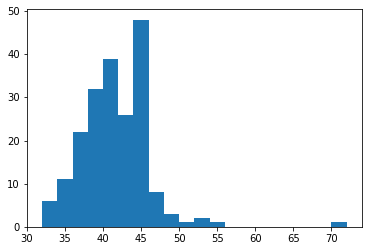

In [24]:
fig, ax = plt.subplots(1, 1, figsize=(6, 4))
ax.hist(shapes[:, 2], bins=20)
fig.show()

De même, pour les espacements entre tranches, les valeurs différent mais cette fois-ci sur les 2 premiers axes. On remarque un mode au niveau de 0.782 mm aussi bien pour l'axe x que l'axe y.

<ipython-input-25-7ce459afd7b0>:8: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


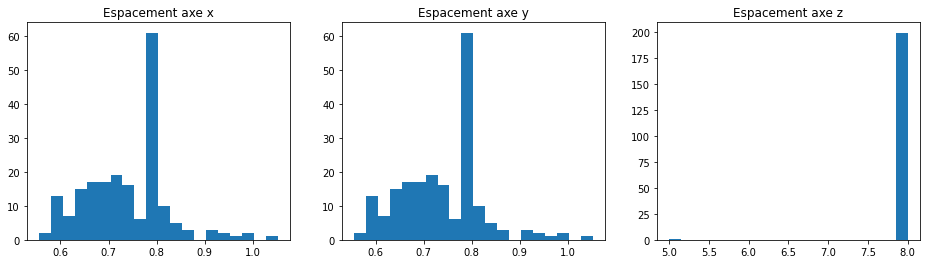

In [25]:
fig, ax = plt.subplots(1, 3, figsize=(16, 4))
ax[0].set_title('Espacement axe x')
ax[0].hist(spacings[:, 0], bins=20)
ax[1].set_title('Espacement axe y')
ax[1].hist(spacings[:, 1], bins=20)
ax[2].set_title('Espacement axe z')
ax[2].hist(spacings[:, 2], bins=20)
fig.show()

**En conclusion, nous allons devoir uniformiser l'espacement inter-pixels sur les axes x et y au sein de notre base de données. Nous allons demander non plus à `nibabel` mais `SimpleITK` de le faire pour nous et de fixer un espacement de référence médian, à savoir (x=0.782, y=0.782, z=8).**

**Ceci va avoir pour impact de modifier le nombre de pixels sur les axes x et y !**

In [26]:
from typing import Tuple
import SimpleITK as sitk

#### RE-ECHANTILLONAGE AVEC LE PACKAGE SIMPLE ITK.
def _resize_volume_itk(
        volume: np.ndarray,
        original_spacing: Tuple[float, float, float],
        out_spacing: Tuple[float, float, float] = (0.782, 0.782, 8.0)
    ):
    """
    Ré-échantillonage de l'image par rapport à un espacement (mm) de référence.
    On utilise SimpleITK pour ce faire. Attention : le volume en sortie aura
    un espacement homogène avec les autres volumes de la base, mais pas forcément
    les mêmes dimensions !
    """
    # on inverse les composantes x, y, z vers z, x, y pour les deux
    # paramètres d'entrée.
    original_spacing = original_spacing[::-1]
    out_spacing = out_spacing[::-1]
    # on récupère l'image `SimpleITK` associée à volume matriciel.
    ctvol_itk = sitk.GetImageFromArray(volume)
    # sur cette image, on définit l'espacement.
    ctvol_itk.SetSpacing(list(np.array(original_spacing, dtype='float')))
    # on récupère la taille de l'image.
    original_size = ctvol_itk.GetSize()
    # (origshape x origspacing) = (outshape x outspacing).
    out_shape = [
        int(np.round(original_size[0] * (original_spacing[0] / out_spacing[0]))),
        int(np.round(original_size[1] * (original_spacing[1] / out_spacing[1]))),
        int(np.round(original_size[2] * (original_spacing[2] / out_spacing[2])))
    ]
    # On effectue le ré-échantillonnage.
    resample = sitk.ResampleImageFilter()
    resample.SetOutputSpacing(out_spacing)
    resample.SetSize(out_shape)
    resample.SetOutputDirection(ctvol_itk.GetDirection())
    resample.SetOutputOrigin(ctvol_itk.GetOrigin())
    resample.SetTransform(sitk.Transform())
    resample.SetDefaultPixelValue(ctvol_itk.GetPixelIDValue())
    resample.SetInterpolator(sitk.sitkBSpline)
    resampled_ctvol = resample.Execute(ctvol_itk)
    # on récupère le résultat final sous la forme d'un numpy array.
    final_ctvol = sitk.GetArrayFromImage(resampled_ctvol)
    return final_ctvol


def resize_volume_itk(
        volume: np.ndarray,
        filepath: str,
        out_spacing: Tuple[float, float, float] = (0.782, 0.782, 8.0)
    ):
    """Cette fonction reprend la précédente de manière plus synthétique."""
    original_spacing = nib.load(filepath).header.get_zooms()
    return _resize_volume_itk(volume, original_spacing)

In [27]:
pre_load = True
# ici, on ne parallélise là car les opérations faites dans la fonction resize_volume_itk
# entraînent des erreurs.
if not pre_load:
    # avec infection.
    abnormal_scans_itk = []
    for scan, file in tqdm(zip(abnormal_scans_raw, abnormal_scan_paths), total=100):
        abnormal_scans_itk.append(resize_volume_itk(scan, file))
    pk.dump(abnormal_scans_itk, open('/content/gdrive/MyDrive/data/covid/abnormal_scans_itk.pk', 'wb'))
    # sans infection.
    normal_scans_itk = []
    for scan, file in tqdm(zip(normal_scans_raw, normal_scan_paths), total=100):
        normal_scans_itk.append(resize_volume_itk(scan, file))
    pk.dump(normal_scans_itk, open('/content/gdrive/MyDrive/data/covid/normal_scans_itk.pk', 'wb'))
else:
    abnormal_scans_itk = pk.load(open('/content/gdrive/MyDrive/data/covid/abnormal_scans_itk.pk', 'rb'))
    normal_scans_itk = pk.load(open('/content/gdrive/MyDrive/data/covid/normal_scans_itk.pk', 'rb'))

Désormais, tous les volumes ont le même volume par pixel. Qu'en est-il des tailles des volumes ? Elles ne sont plus du tout homogène désormais !

In [28]:
shapes = np.array([scan.shape for scan in abnormal_scans_itk+normal_scans_itk])

<ipython-input-29-aba7aac533d4>:8: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


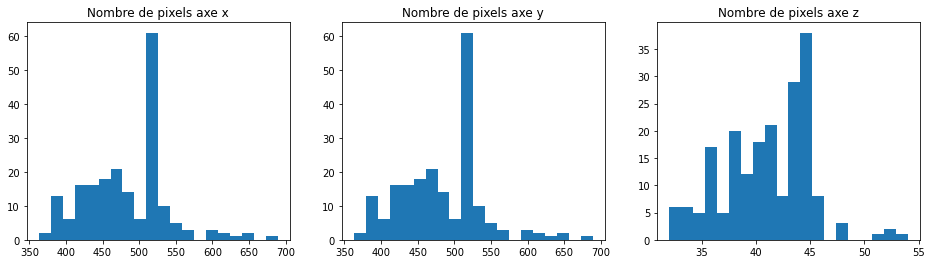

In [29]:
fig, ax = plt.subplots(1, 3, figsize=(16, 4))
ax[0].set_title('Nombre de pixels axe x')
ax[0].hist(shapes[:, 0], bins=20)
ax[1].set_title('Nombre de pixels axe y')
ax[1].hist(shapes[:, 1], bins=20)
ax[2].set_title('Nombre de pixels axe z')
ax[2].hist(shapes[:, 2], bins=20)
fig.show()

**On peut également ré-échantillonner par rapport à une taille de référence.**

In [30]:
#### RE-ECHANTILLONAGE AVEC LE PACKAGE NIBABEL.
def resize_volume_nib(
    volume: np.ndarray,
    desired_depth: int = 40, # paramètre `z` recherché.
    desired_width: int = 256, # paramètre `x` recherché.
    desired_height: int = 256 # paramètre `y` recherché.
) -> np.ndarray:
    """Ré-échantillonage par rapport aux dimensions des images finales avec
    le package nibabel. Par cette méthode, les dimensions des volumes seront 
    homogènes au sein des différents échantillons de données. En revanche, 
    l'espacement sur les axes x, y (et même z) ne sera plus le même !
    """
    # Paramètres z, x, y observés sur l'image.
    # On suppose ici que ces paramètres sont identiques
    # quelque soit le voxel considéré sur le scanner
    # du patient.
    current_depth = volume.shape[2]
    current_width = volume.shape[0]
    current_height = volume.shape[1]
    # On calcule alors les ratios selon les 3 dimensions.
    depth = current_depth / desired_depth
    width = current_width / desired_width
    height = current_height / desired_height
    depth_factor = 1 / depth
    width_factor = 1 / width
    height_factor = 1 / height
    volume = ndimage.zoom(
        volume,
        (width_factor, height_factor, depth_factor),
        order=1
    )
    return volume


In [31]:
pre_load = True
# ici, on ne parallélise là car les opérations faites dans la fonction resize_volume_itk
# entraînent des erreurs.
# taille de référence : 256 x 256 x 40
if not pre_load:
    # avec infection.
    abnormal_scans_nib = []
    for scan in tqdm(abnormal_scans_raw):
        abnormal_scans_nib.append(resize_volume_nib(scan))
    pk.dump(abnormal_scans_nib, open('/content/gdrive/MyDrive/data/covid/abnormal_scans_nib.pk', 'wb'))
    # sans infection.
    normal_scans_nib = []
    for scan in tqdm(normal_scans_raw):
        normal_scans_nib.append(resize_volume_nib(scan))
    pk.dump(normal_scans_nib, open('/content/gdrive/MyDrive/data/covid/normal_scans_nib.pk', 'wb'))
else:
    abnormal_scans_nib = pk.load(open('/content/gdrive/MyDrive/data/covid/abnormal_scans_nib.pk', 'rb'))
    normal_scans_nib = pk.load(open('/content/gdrive/MyDrive/data/covid/normal_scans_nib.pk', 'rb'))

Désormais toutes les tailles sur les 3 axes sont homogènes, ce qui n'est pas le cas des espacements (ce ne l'était pas avant...)

In [32]:
shapes = np.array([scan.shape for scan in abnormal_scans_nib+normal_scans_nib])

<ipython-input-33-aba7aac533d4>:8: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


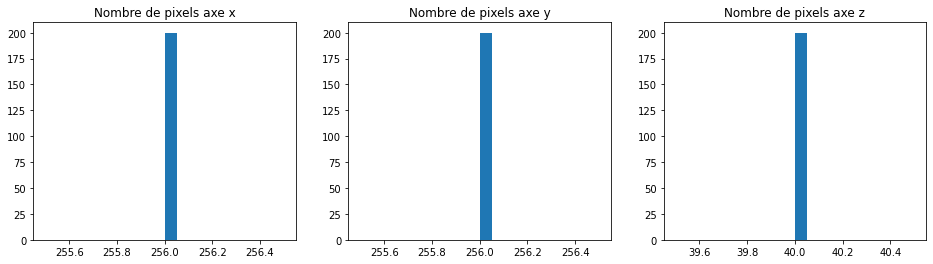

In [33]:
fig, ax = plt.subplots(1, 3, figsize=(16, 4))
ax[0].set_title('Nombre de pixels axe x')
ax[0].hist(shapes[:, 0], bins=20)
ax[1].set_title('Nombre de pixels axe y')
ax[1].hist(shapes[:, 1], bins=20)
ax[2].set_title('Nombre de pixels axe z')
ax[2].hist(shapes[:, 2], bins=20)
fig.show()

### Affichage des scans

In [34]:
import matplotlib.pyplot as plt

In [35]:
def plot_slices(
    image: np.ndarray,
    num_rows: int,
    num_columns: int,
    width: int = 128,
    height: int = 128
) -> None:
    """Affichage de 20 coupes 2D d'un volume donné par `data`."""
    assert num_rows * num_columns == image.shape[-1], "Le nombre de coupes doit correspondre aux nombres d'images souhaitées!"
    # rotation.
    data = np.rot90(np.array(image))
    # transposition.
    data = np.transpose(data)
    # on modifie la structure des coupes :
    # on passe de (128, 128, z) à (num_rows, num_columns, 128, 128)
    # attention, il faut que num_rows x num_columns = z !
    data = np.reshape(
        data, (num_rows, num_columns, width, height)
    )
    rows_data, columns_data = data.shape[0], data.shape[1]
    heights = [slc[0].shape[0] for slc in data]
    widths = [slc.shape[1] for slc in data[0]]
    fig_width = 12.0
    fig_height = fig_width * sum(heights) / sum(widths)
    f, axarr = plt.subplots(
        rows_data,
        columns_data,
        figsize=(fig_width, fig_height),
        gridspec_kw={"height_ratios": heights},
    )
    for i in range(rows_data):
        for j in range(columns_data):
            axarr[i, j].imshow(data[i][j], cmap="gray")
            axarr[i, j].axis("off")
    plt.subplots_adjust(wspace=0, hspace=0, left=0, right=1, bottom=0, top=1)
    plt.show()

#### Données brutes

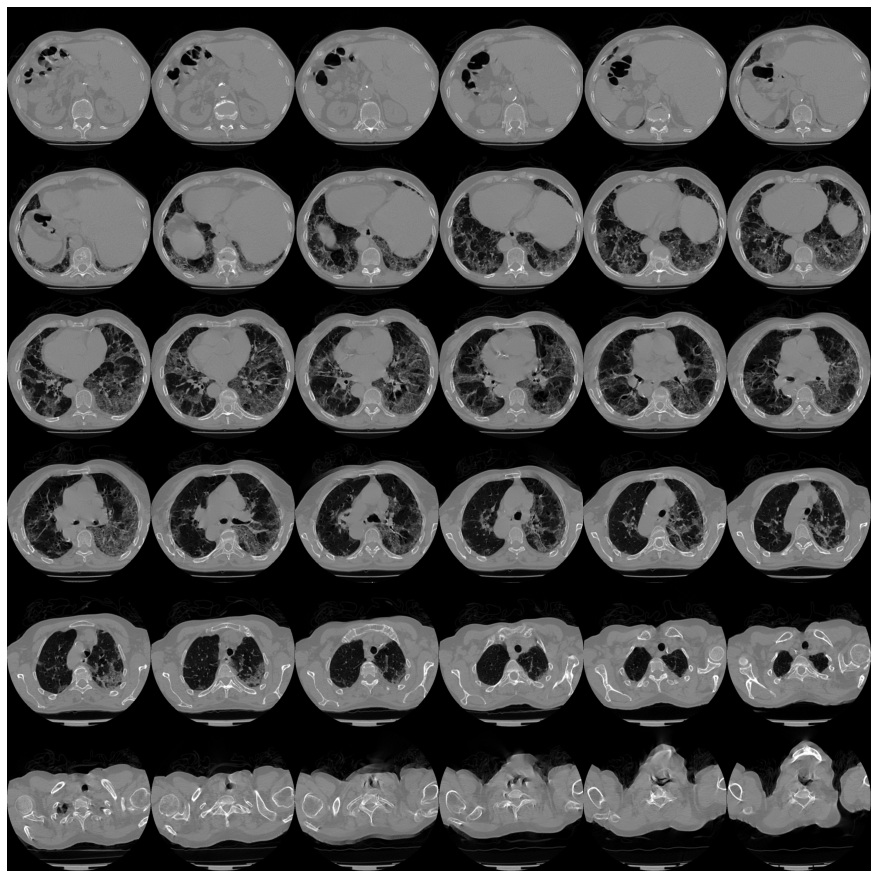

In [36]:
# premier exemple : 11 (y=1).
plot_slices(abnormal_scans_raw[11][..., 3:], 6, 6, width=512, height=512)

#### Données ré-échantillonnées avec `SimpleITK`

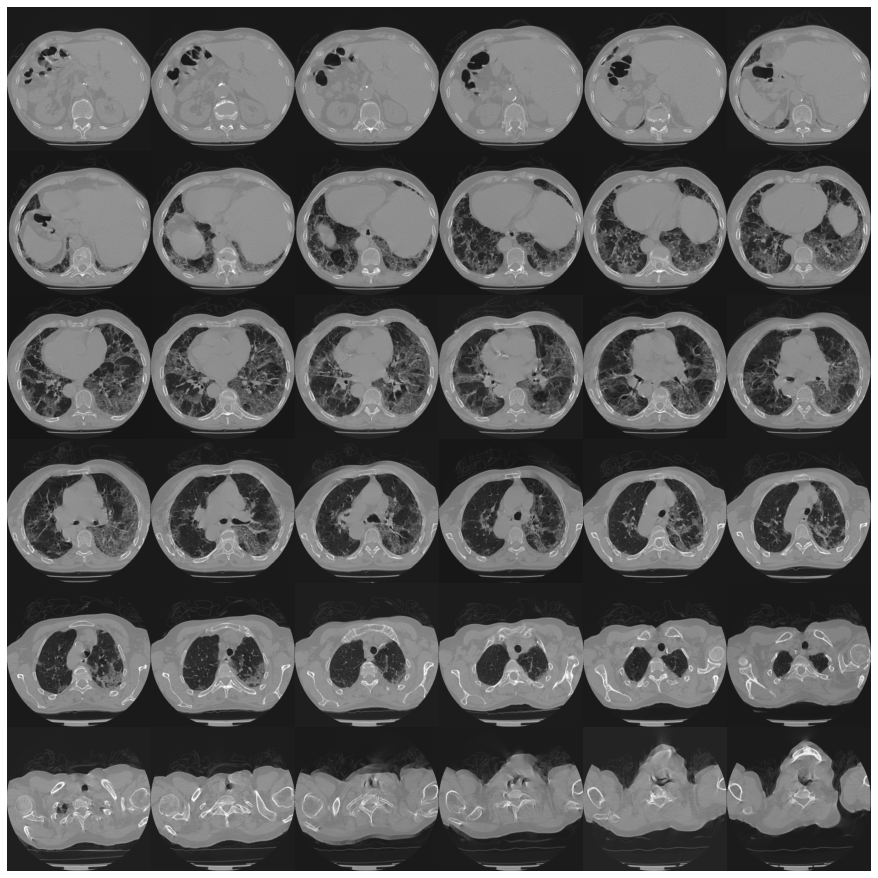

In [37]:
# premier exemple : 11 (y=1).
plot_slices(abnormal_scans_itk[11][..., 3:], 6, 6, width=369, height=369)

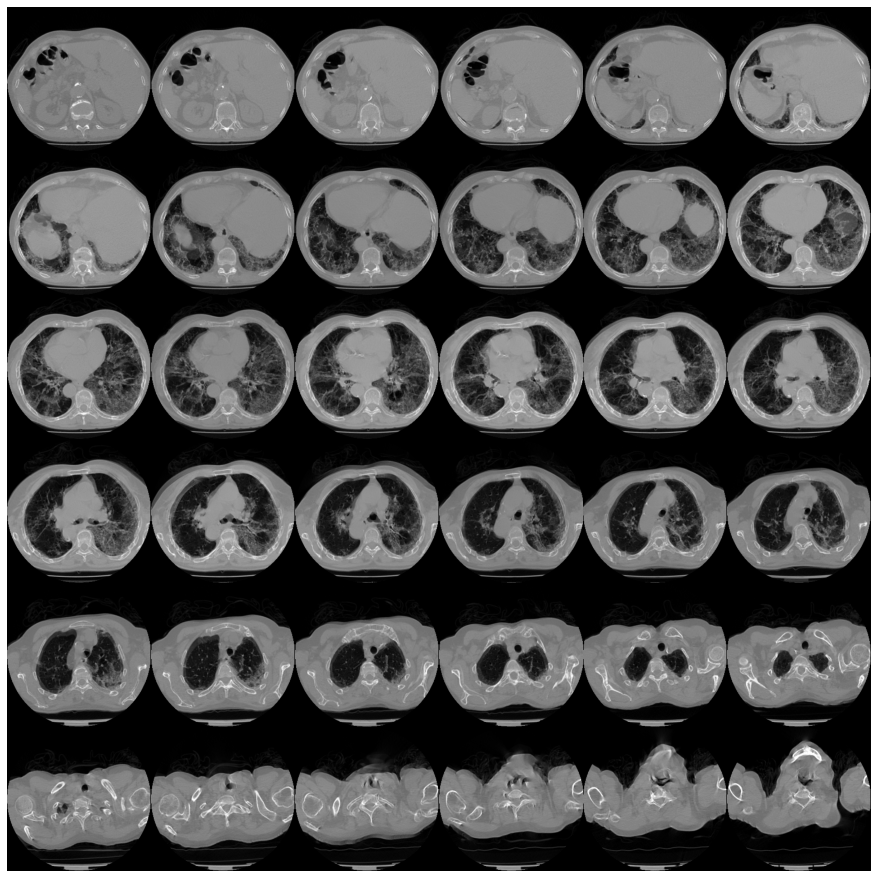

In [38]:
# premier exemple : 11 (y=1).
plot_slices(abnormal_scans_nib[11][..., 4:], 6, 6, width=256, height=256)

## Cropping

Avec la méthode de `nibabel`, le nombre de tranches par scan est homogène (tout comme le nombre de pixels par tranche) ! On peut choisir d'en enlever une partie arbitraire aux extrêmités de la numérisation pour enlever, sur tous les scans, les tranches qui ne portent pas réellement d'informations diagnostiques utiles pour l'entraînement.

In [39]:
abnormal_scans_nib_crop = [scan[..., 8:-8] for scan in abnormal_scans_nib]
normal_scans_nib_crop = [scan[..., 8:-8] for scan in normal_scans_nib]

In [40]:
print(f'Taille des volumes : {abnormal_scans_nib_crop[0].shape}')

Taille des volumes : (256, 256, 24)


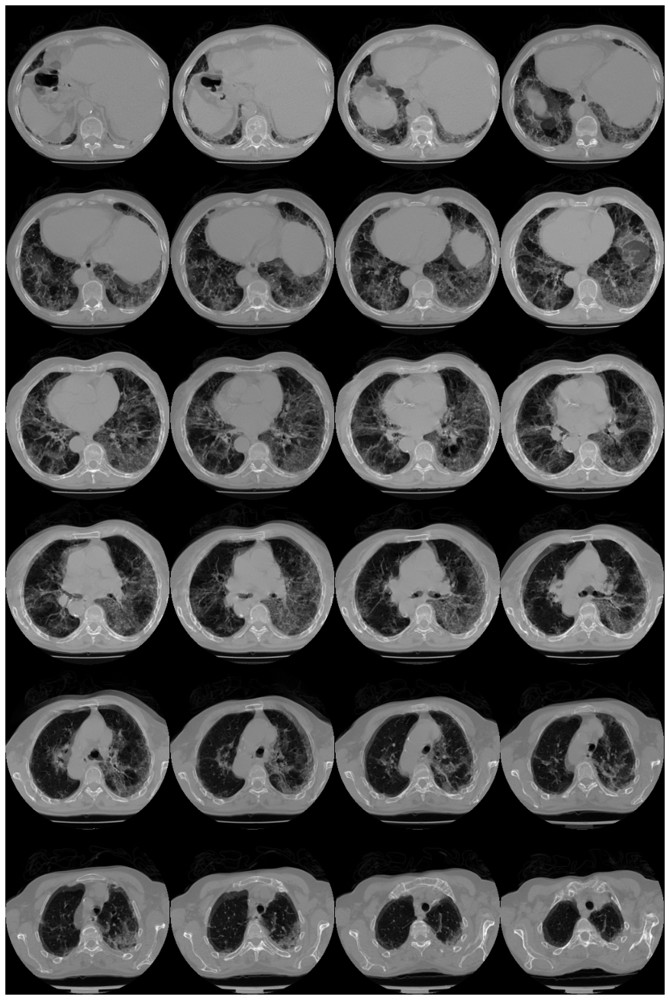

In [41]:
# premier exemple : 11 (y=1).
plot_slices(abnormal_scans_nib_crop[11], 6, 4, width=256, height=256)

## Construction des échantillons de train et validation.

On enregistre les données d'intérêt `x_train, y_train, x_val, y_val` dans `datasets/covid/`. 

In [42]:
pre_load = True
if not pre_load:
    # on stacke tous les volumes dans une seule et même matrice.
    # cela prendre du temps...
    abnormal_scans = np.array(abnormal_scans_nib_crop)
    normal_scans = np.array(normal_scans_nib_crop)
    # on définit les labels: 1 infecté, 0 sain.
    abnormal_labels = np.array([1 for _ in range(len(abnormal_scans))])
    normal_labels = np.array([0 for _ in range(len(normal_scans))])
    # split 70/30 pour train / validation, soit 140/60 scans.
    x_train = np.concatenate((abnormal_scans[:70], normal_scans[:70]), axis=0)
    y_train = np.concatenate((abnormal_labels[:70], normal_labels[:70]), axis=0)
    x_val = np.concatenate((abnormal_scans[70:], normal_scans[70:]), axis=0)
    y_val = np.concatenate((abnormal_labels[70:], normal_labels[70:]), axis=0)
    # on enregistre les données.
    # pratique à améliorer : ne pas enregistrer au format pickle mais plutôt json !
    np.save(open('/content/gdrive/MyDrive/data/covid/x_train', 'wb'), x_train, allow_pickle=True)
    np.save(open('/content/gdrive/MyDrive/data/covid/x_val', 'wb'), x_val, allow_pickle=True)
    np.save(open('/content/gdrive/MyDrive/data/covid/y_train', 'wb'), y_train, allow_pickle=True)
    np.save(open('/content/gdrive/MyDrive/data/covid/y_val', 'wb'), y_val, allow_pickle=True)
else:
    x_train = np.load(open('/content/gdrive/MyDrive/data/covid/x_train', 'rb'))
    x_val = np.load(open('/content/gdrive/MyDrive/data/covid/x_val', 'rb'))
    y_train = np.load(open('/content/gdrive/MyDrive/data/covid/y_train', 'rb'))
    y_val = np.load(open('/content/gdrive/MyDrive/data/covid/y_val', 'rb'))

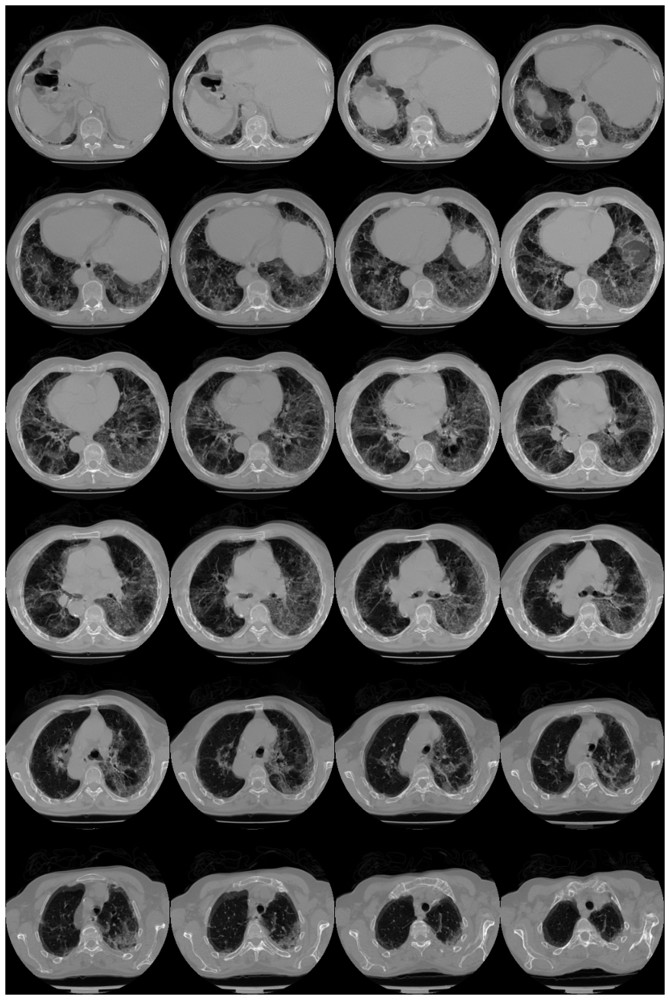

In [43]:
# premier exemple : 11 (y=1).
plot_slices(x_train[11], 6, 4, width=256, height=256)

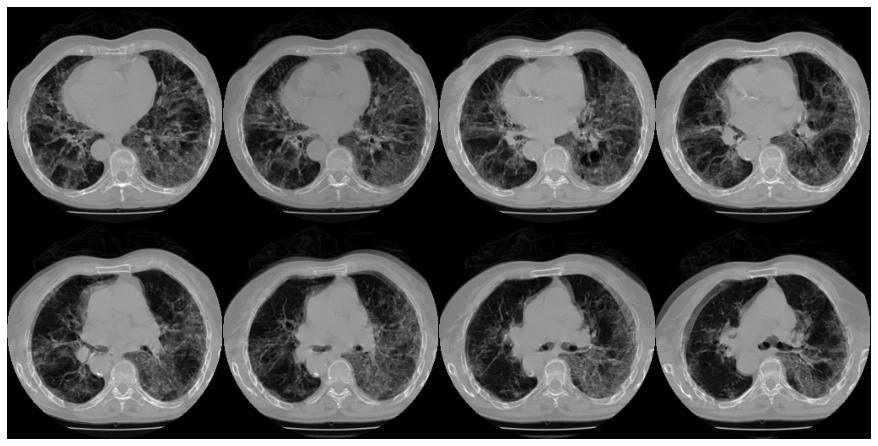

In [44]:
# premier exemple zoomé : 11 (y=1).
plot_slices(x_train[11][..., 8:16], 2, 4, width=256, height=256)

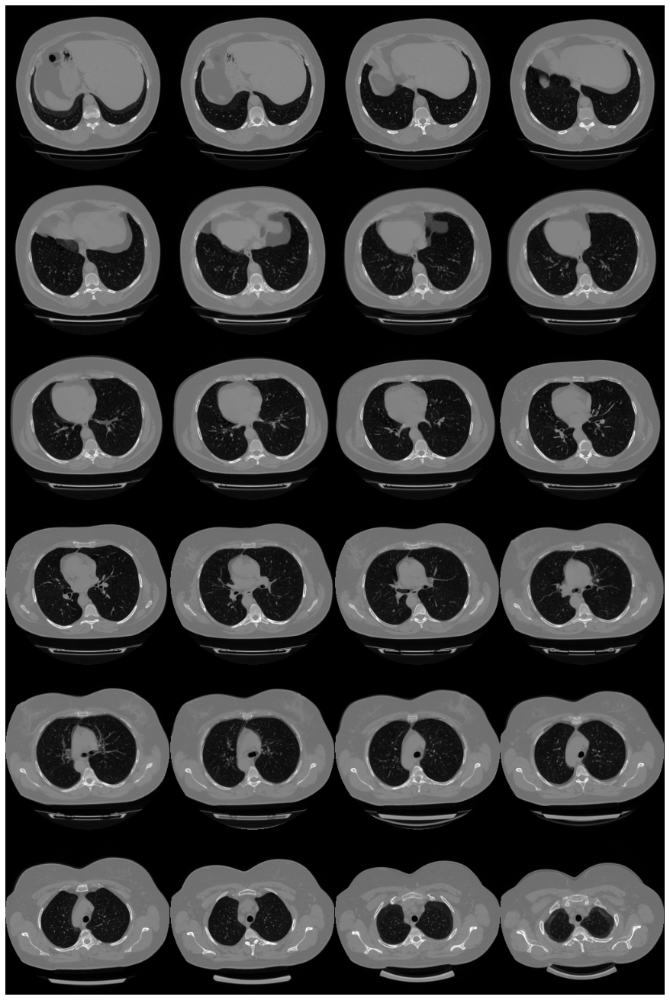

In [45]:
# deuxième exemple : sain (y=0).
plot_slices(x_train[71], 6, 4, width=256, height=256)

## Pipelines d'entraînement et de validation

In [46]:
physical_devices = tf.config.list_physical_devices('CPU')
tf.config.set_visible_devices(physical_devices, 'CPU')

In [47]:
# On définit les générateurs (x, y) pour les deux échantillons
# avec la fonction `from_tensor_slices` de `tf.data.Dataset`.
train_loader = tf.data.Dataset.from_tensor_slices((x_train, y_train))
validation_loader = tf.data.Dataset.from_tensor_slices((x_val, y_val))

## Normalisation des volumes

In [48]:
def whitening(vol: np.ndarray) -> np.ndarray:
    """Moyenne 0, écart-type 1."""
    mean = np.mean(vol)
    std = np.std(vol)
    if std > 0:
        ret = (vol - mean) / std
    else:
        ret = vol * 0.
    return ret


def normalise_zero_one(vol: np.ndarray) -> np.ndarray:
    """Intensités normalisées entre 0 et 1."""
    minimum = np.min(vol)
    maximum = np.max(vol)
    if maximum > minimum:
        ret = (vol - minimum) / (maximum - minimum)
    else:
        ret = vol * 0.
    return ret


def normalise_one_one(vol: np.ndarray) -> np.ndarray:
    """Intensités normalisées entre -1 et 1."""
    ret = normalise_zero_one(vol)
    ret *= 2.
    ret -= 1.
    return ret

#### Visualisation

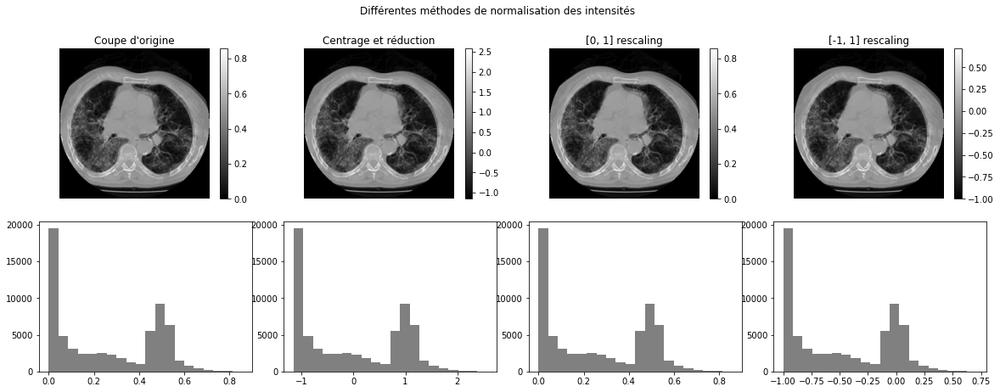

In [49]:
f, axarr = plt.subplots(2, 4, figsize=(20, 7))
f.suptitle('Différentes méthodes de normalisation des intensités')

coupe = x_train[11][..., 12]

img = axarr[0, 0].imshow(coupe, cmap='gray');
axarr[0, 0].axis('off')

axarr[0, 0].set_title("Coupe d'origine")
f.colorbar(img, ax=axarr[0, 0])
axarr[1, 0].hist(
    x_train[11][..., 12].flatten(),
    bins=20,
    color='gray'
)

img = axarr[0, 1].imshow(whitening(x_train[11])[..., 12], cmap='gray');
axarr[0, 1].axis('off')
axarr[0, 1].set_title('Centrage et réduction')
f.colorbar(img, ax=axarr[0, 1])
axarr[1, 1].hist(
    whitening(x_train[11])[..., 12].flatten(),
    bins=20,
    color='gray'
)

img = axarr[0, 2].imshow(normalise_zero_one(x_train[11])[..., 12], cmap='gray');
axarr[0, 2].axis('off')
axarr[0, 2].set_title('[0, 1] rescaling')
f.colorbar(img, ax=axarr[0, 2])
axarr[1, 2].hist(
    normalise_zero_one(x_train[11])[..., 12].flatten(),
    bins=20,
    color='gray'
)

img = axarr[0, 3].imshow(normalise_one_one(x_train[11])[..., 12], cmap='gray');
axarr[0, 3].axis('off')
axarr[0, 3].set_title('[-1, 1] rescaling')
f.colorbar(img, ax=axarr[0, 3])
axarr[1, 3].hist(
    normalise_one_one(x_train[11])[..., 12].flatten(),
    bins=20,
    color='gray'
)
    
f.subplots_adjust(wspace=0.15, hspace=0.15)
plt.show();

## Augmentation des volumes

In [50]:
from typing import List, Union
from scipy import ndimage

def flip(vol: np.ndarray, axis : Union[int, List[int]] = 1) -> np.ndarray:
    """Flip selon les l'axe spécifié par `axis`."""
    # flip aléatoire avec probabilité 0.5.
    do_flip = np.random.random(1)
    volume = np.flip(vol, axis=axis) if do_flip > 0.5 else vol
    return volume


def add_gaussian_noise(vol: np.ndarray, sigma: float = 0.05) -> np.ndarray:
    """Ajout d'un bruit gaussien d'amplitude `sigma`."""
    do_noise = np.random.random(1)
    # bruitage avec probabilité 0.2.
    if do_noise:
        volume = vol + np.random.normal(0, sigma, vol.shape)
    else:
        volume = vol + 0.
    return volume.astype(np.float32)


def rotate(vol: np.ndarray, theta: float = 20) -> np.ndarray:
    """Rotation entre -theta° et theta°."""
    # on choisit alétaoirement un angle.
    angle = np.random.choice(np.linspace(-theta, theta, 100))
    # on procéde à une rotation.
    volume = ndimage.rotate(vol, angle, reshape=False)
    volume[volume < 0] = 0
    volume[volume > 1] = 1
    return volume


def elastic_transform(vol: np.ndarray, alpha: List[float], sigma: List[float]) -> np.ndarray:
    """Déformation élastique décrite par [1]
    [1] Simard, Steinkraus and Platt, "Best Practices for Convolutional
        Neural Networks applied to Visual Document Analysis", in Proc. of the
        International Conference on Document Analysis and Recognition, 2003.
    Basée sur la source suivante : https://gist.github.com/erniejunior/601cdf56d2b424757de5
    
    Args:
        alpha : échelle de déformation pour chaque dimension
                (l'intensité de la déformation augmente avec alpha).
        sigma : fenêtre de déformation pour chaque dimension
                (valeurs faibles associées à une déformation plus locale).
    """
    assert len(alpha) == len(sigma), \
        "Les tailles d'alpha et sigma doivent correspondre."
    channelbool = vol.ndim - len(alpha)
    out = np.zeros((len(alpha) + channelbool, ) + vol.shape)
    for jj in range(len(alpha)):
        array = (np.random.rand(*vol.shape) * 2 - 1)
        out[jj] = gaussian_filter(array, sigma[jj],
                                  mode="constant", cval=0) * alpha[jj]
    shapes = list(map(lambda x: slice(0, x, None), vol.shape))
    grid = np.broadcast_arrays(*np.ogrid[shapes])
    indices = list(map((lambda x: np.reshape(x, (-1, 1))), grid + np.array(out)))
    transformed_volume = map_coordinates(
        vol, indices, order=0,
        mode='reflect'
    ).reshape(vol.shape)
    return transformed_volume

#### Coupes d'origine

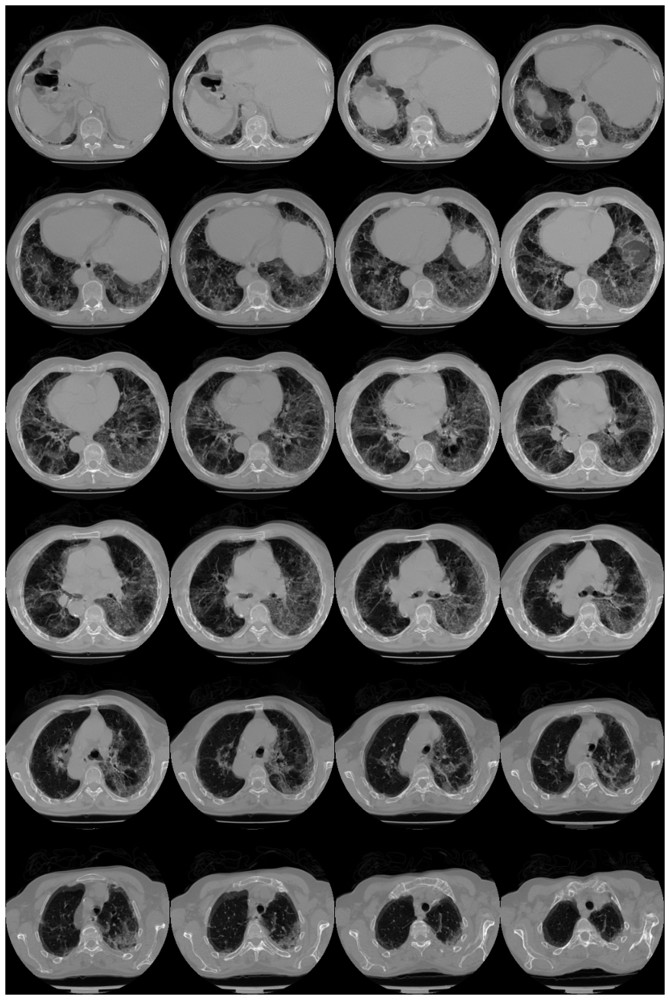

In [51]:
plot_slices(x_train[11], 6, 4, width=256, height=256)

#### Flip

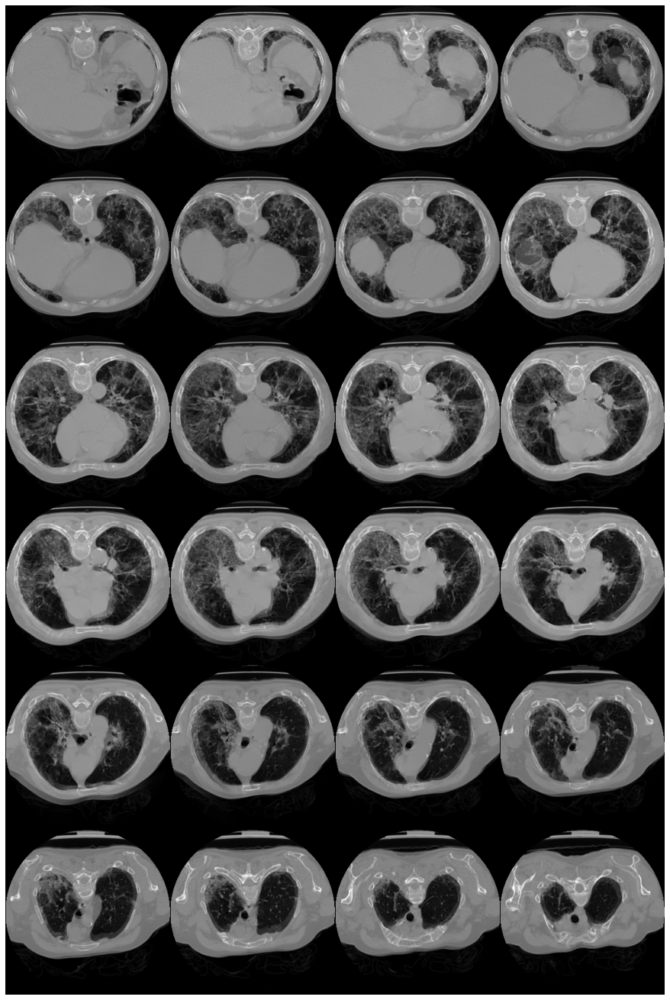

In [52]:
# premier exemple : 11 (y=1).
plot_slices(flip(x_train[11], axis=(0, 1)), 6, 4, width=256, height=256)

#### Rotation

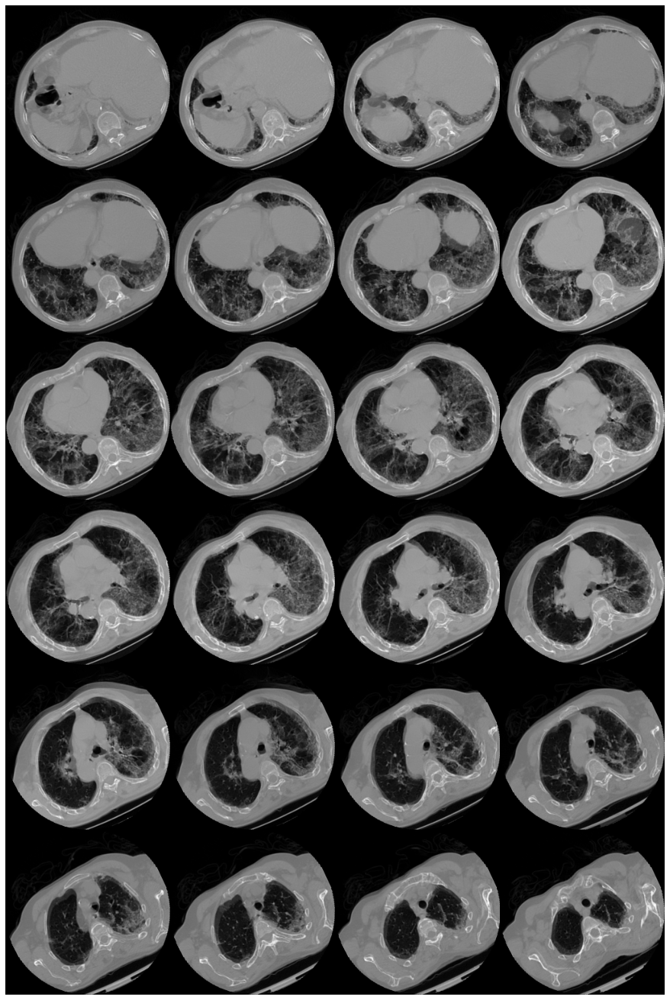

In [53]:
plot_slices(rotate(x_train[11], theta=30), 6, 4, width=256, height=256)

#### Bruit gaussien

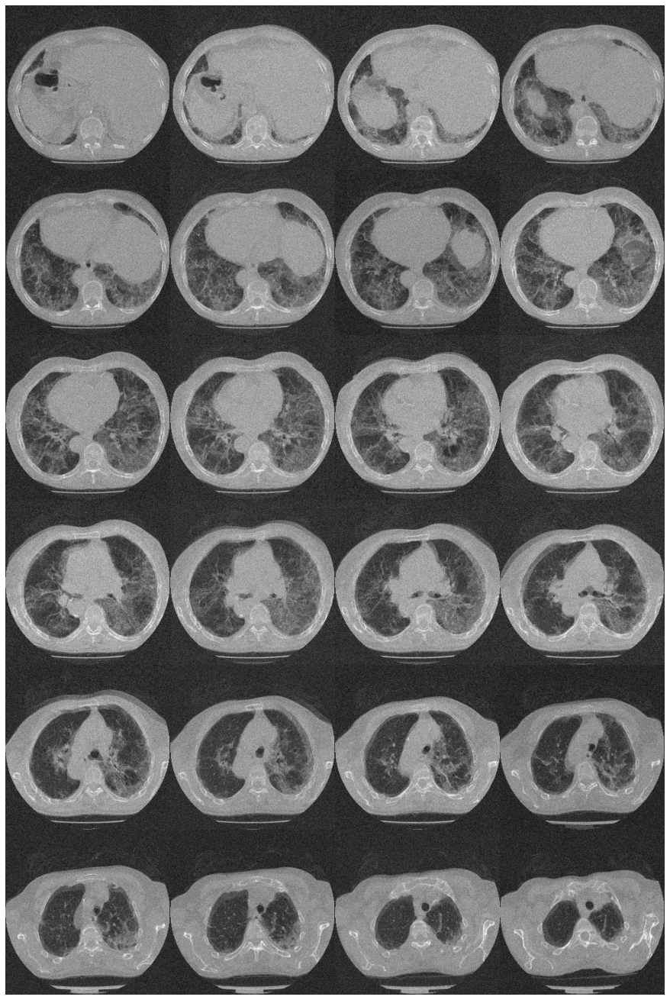

In [54]:
plot_slices(add_gaussian_noise(x_train[11], sigma=0.05), 6, 4, width=256, height=256)

#### Déformation élastique

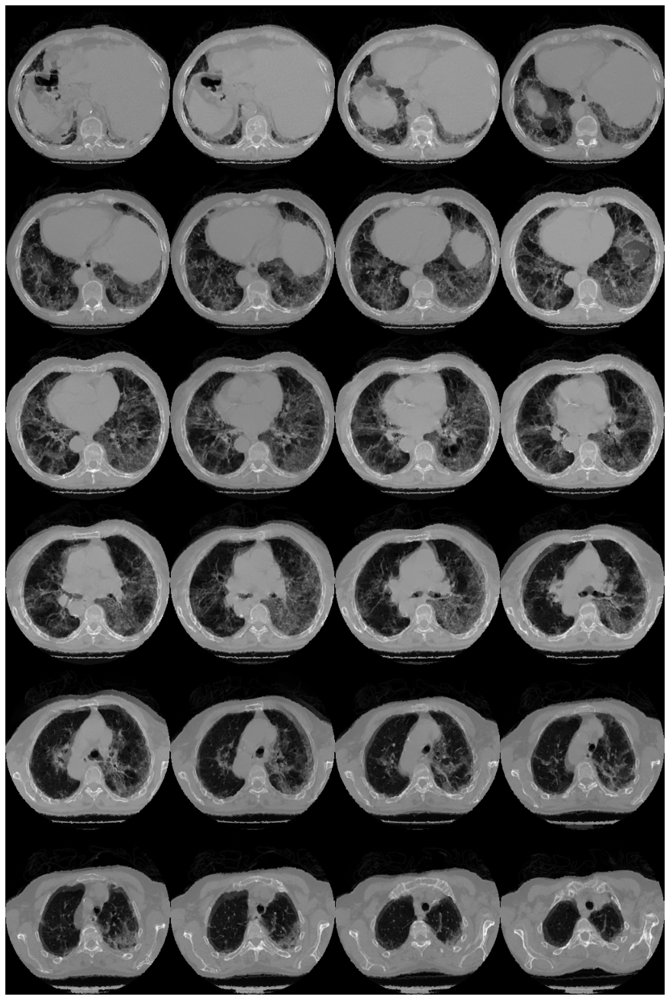

In [55]:
plot_slices(elastic_transform(x_train[11], alpha=[5, 5, 5], sigma=[1, 5, 5]), 6, 4, width=256, height=256)

### Exemple sur une coupe

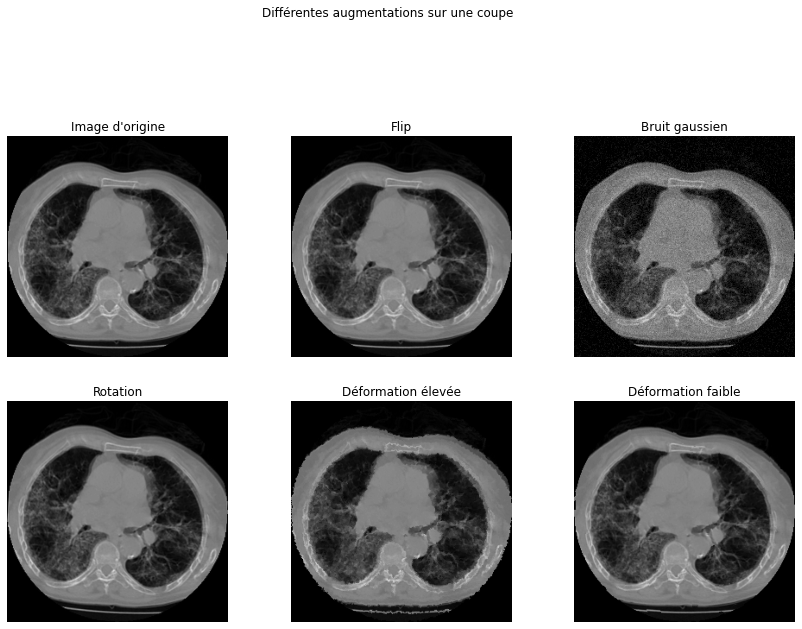

In [56]:
# Visualise using matplotlib
f, axarr = plt.subplots(2, 3, figsize=(15,10));
f.suptitle('Différentes augmentations sur une coupe')


axarr[0, 0].imshow(coupe, cmap='gray', vmin=0, vmax=1);
axarr[0, 0].axis('off')
axarr[0, 0].set_title("Image d'origine")

axarr[0, 1].imshow(flip(coupe, axis=(0, 1)), cmap='gray', vmin=0, vmax=1);
axarr[0, 1].axis('off')
axarr[0, 1].set_title('Flip')

axarr[0, 2].imshow(add_gaussian_noise(coupe), cmap='gray', vmin=0, vmax=1);
axarr[0, 2].axis('off')
axarr[0, 2].set_title('Bruit gaussien')

axarr[1, 0].imshow(rotate(coupe, theta=30), cmap='gray', vmin=0, vmax=1);
axarr[1, 0].axis('off')
axarr[1, 0].set_title('Rotation')

axarr[1, 1].imshow(elastic_transform(coupe, alpha=[3, 3], sigma=[1, 1]), cmap='gray', vmin=0, vmax=1);
axarr[1, 1].axis('off')
axarr[1, 1].set_title('Déformation élevée')

axarr[1, 2].imshow(elastic_transform(coupe, alpha=[10, 10], sigma=[5, 5]), cmap='gray', vmin=0, vmax=1);
axarr[1, 2].axis('off')
axarr[1, 2].set_title('Déformation faible')
    
f.subplots_adjust(wspace=0.05, top=0.8)
plt.show();

## Application des augmentations

In [57]:
@tf.function
def tf_whitening(x):
    return tf.numpy_function(whitening, [x], tf.float32)

@tf.function
def tf_flip(x):
    return tf.numpy_function(flip, [x], tf.float32)

@tf.function
def tf_rotate(x):
    return tf.numpy_function(rotate, [x], tf.float32)

@tf.function
def tf_add_gaussian_noise(x):
    return tf.numpy_function(add_gaussian_noise, [x], tf.float32)


augmentations = tf.keras.Sequential()
augmentations.add(tf.keras.layers.Lambda(tf_whitening)) # ceci n'est pas à proprement parler une augmentation.
augmentations.add(tf.keras.layers.Lambda(tf_flip))
augmentations.add(tf.keras.layers.Lambda(tf_rotate))
augmentations.add(tf.keras.layers.Lambda(tf_add_gaussian_noise))

In [58]:
def cast(volume: tf.Tensor):
    """Process training data by rotating and adding a channel."""
    return tf.expand_dims(volume, axis=3)

In [62]:
batch_size = 2
# Normalisation, augmentation et ajout d'une dimension. 
train_dataset = (
    train_loader.shuffle(len(x_train))
    .cache()
    .map(
        lambda x, y: (cast(augmentations(x)), y),
        num_parallel_calls=tf.data.AUTOTUNE
    )
    .batch(batch_size)
    .prefetch(2)
)
# Normalisation et ajout d'une dimension.
validation_dataset = (
    validation_loader.shuffle(len(x_val))
    .cache()
    .map(
        lambda x, y: (cast(tf_whitening(x)), y),
        num_parallel_calls=tf.data.AUTOTUNE
    )
    .cache()
    .batch(batch_size)
    .prefetch(2)
)

## Définition du modèle

In [65]:
def get_model(width: int = 256, height: int = 256, depth: int = 24):
    """CNN 3D."""

    inputs = tf.keras.Input((width, height, depth, 1))

    x = tf.keras.layers.Conv3D(
        filters=64, kernel_size=3, activation="relu", padding='same')(inputs)
    x = tf.keras.layers.MaxPool3D(pool_size=2)(x)
    x = tf.keras.layers.BatchNormalization()(x)

    x = tf.keras.layers.Conv3D(
        filters=128, kernel_size=3, activation="relu", padding='same')(x)
    x = tf.keras.layers.MaxPool3D(pool_size=2)(x)
    x = tf.keras.layers.BatchNormalization()(x)

    x = tf.keras.layers.Conv3D(
        filters=256, kernel_size=3, activation="relu", padding='same')(x)
    x = tf.keras.layers.MaxPool3D(pool_size=2)(x)
    x = tf.keras.layers.BatchNormalization()(x)

    x = tf.keras.layers.Conv3D(
        filters=256, kernel_size=3, activation="relu",  padding='same')(x)
    x = tf.keras.layers.MaxPool3D(pool_size=2)(x)
    x = tf.keras.layers.BatchNormalization()(x)

    x = tf.keras.layers.GlobalAveragePooling3D()(x)
    x = tf.keras.layers.Dense(units=512, activation="relu")(x)
    x = tf.keras.layers.Dropout(0.3)(x)

    outputs = tf.keras.layers.Dense(units=1, activation="sigmoid")(x)

    model = tf.keras.Model(inputs, outputs, name="3dcnn")
    return model

model = get_model()
model.summary()

Model: "3dcnn"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         [(None, 256, 256, 24, 1)] 0         
_________________________________________________________________
conv3d_8 (Conv3D)            (None, 256, 256, 24, 64)  1792      
_________________________________________________________________
max_pooling3d_8 (MaxPooling3 (None, 128, 128, 12, 64)  0         
_________________________________________________________________
batch_normalization_8 (Batch (None, 128, 128, 12, 64)  256       
_________________________________________________________________
conv3d_9 (Conv3D)            (None, 128, 128, 12, 128) 221312    
_________________________________________________________________
max_pooling3d_9 (MaxPooling3 (None, 64, 64, 6, 128)    0         
_________________________________________________________________
batch_normalization_9 (Batch (None, 64, 64, 6, 128)    512   

## Entraînement

In [66]:
lr_schedule = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_acc', factor=0.1, patience=10, verbose=1,
    mode='auto', min_delta=0.0001
)

logger = tf.keras.callbacks.CSVLogger('/content/gdrive/MyDrive/data/models/covid/history.csv', separator=',')

model.compile(
    loss=tf.keras.losses.BinaryCrossentropy(),
    #optimizer=keras.optimizers.Adam(learning_rate=lr_schedule),
    optimizer=keras.optimizers.Adam(learning_rate=1e-4),
    metrics=["acc"],
)
os.makedirs('/content/gdrive/MyDrive/data/models/covid/', exist_ok=True)
checkpoint_cb = keras.callbacks.ModelCheckpoint(
    "/content/gdrive/MyDrive/data/models/covid/3dcnn.h5",
    save_best_only=True
)

epochs = 30
model.fit(
    train_dataset,
    validation_data=validation_dataset,
    epochs=epochs,
    shuffle=True,
    verbose=1,
    callbacks=[logger, checkpoint_cb, lr_schedule]
)

Epoch 1/30
70/70 [==============================] - 30s 326ms/step - loss: 0.7030 - acc: 0.5044 - val_loss: 0.8767 - val_acc: 0.5000
Epoch 2/30
70/70 [==============================] - 27s 323ms/step - loss: 0.6568 - acc: 0.6563 - val_loss: 1.3978 - val_acc: 0.5000
Epoch 3/30
70/70 [==============================] - 26s 311ms/step - loss: 0.6471 - acc: 0.6280 - val_loss: 1.8675 - val_acc: 0.5000
Epoch 4/30
70/70 [==============================] - 24s 285ms/step - loss: 0.6049 - acc: 0.6971 - val_loss: 2.1990 - val_acc: 0.5000
Epoch 5/30
70/70 [==============================] - 26s 290ms/step - loss: 0.5718 - acc: 0.7431 - val_loss: 2.2659 - val_acc: 0.5000
Epoch 6/30
70/70 [==============================] - 26s 325ms/step - loss: 0.5242 - acc: 0.7415 - val_loss: 2.3211 - val_acc: 0.5000
Epoch 7/30
70/70 [==============================] - 25s 318ms/step - loss: 0.4932 - acc: 0.7466 - val_loss: 1.5955 - val_acc: 0.5000
Epoch 8/30
70/70 [==============================] - 26s 316ms/step - 

#### Meilleur run réalisé : 

**Epoch 1/100**
70/70 [==============================] - 33s 230ms/step - loss: 0.7540 - acc: 0.5632 - val_loss: 4.7152 - val_acc: 0.5000

**Epoch 2/100**
70/70 [==============================] - 22s 262ms/step - loss: 0.7136 - acc: 0.5492 - val_loss: 1.0408 - val_acc: 0.5000

**Epoch 3/100**
70/70 [==============================] - 21s 258ms/step - loss: 0.6768 - acc: 0.5592 - val_loss: 3.4028 - val_acc: 0.5000

**Epoch 4/100**
70/70 [==============================] - 19s 247ms/step - loss: 0.6080 - acc: 0.6235 - val_loss: 2.1114 - val_acc: 0.5000

**Epoch 5/100**
70/70 [==============================] - 26s 300ms/step - loss: 0.6102 - acc: 0.6937 - val_loss: 1.1950 - val_acc: 0.5667

**Epoch 6/100**
70/70 [==============================] - 27s 304ms/step - loss: 0.5642 - acc: 0.6113 - val_loss: 0.7207 - val_acc: 0.6000

**Epoch 7/100**
70/70 [==============================] - 29s 353ms/step - loss: 0.5091 - acc: 0.7257 - val_loss: 1.4155 - val_acc: 0.5500

**Epoch 8/100**
70/70 [==============================] - 27s 327ms/step - loss: 0.4987 - acc: 0.7637 - val_loss: 0.7426 - val_acc: 0.6500

**Epoch 9/100**
70/70 [==============================] - 27s 338ms/step - loss: 0.4771 - acc: 0.7324 - val_loss: 0.8789 - val_acc: 0.5833

**Epoch 10/100**
70/70 [==============================] - 27s 289ms/step - loss: 0.4140 - acc: 0.8035 - val_loss: 1.5030 - val_acc: 0.5000

**Epoch 11/100**
70/70 [==============================] - 26s 310ms/step - loss: 0.4596 - acc: 0.7382 - val_loss: 0.6609 - val_acc: 0.7167

**Epoch 12/100**
70/70 [==============================] - 23s 261ms/step - loss: 0.3608 - acc: 0.8076 - val_loss: 0.9578 - val_acc: 0.5500

**Epoch 13/100**
70/70 [==============================] - 27s 309ms/step - loss: 0.3290 - acc: 0.8304 - val_loss: 0.9611 - val_acc: 0.6500

**Epoch 14/100**
70/70 [==============================] - 21s 241ms/step - loss: 0.3176 - acc: 0.8418 - val_loss: 0.7288 - val_acc: 0.7333

**Epoch 15/100**
70/70 [==============================] - 18s 237ms/step - loss: 0.2842 - acc: 0.8920 - val_loss: 0.8813 - val_acc: 0.6167

**Epoch 16/100**
70/70 [==============================] - 18s 224ms/step - loss: 0.2898 - acc: 0.8897 - val_loss: 4.4840 - val_acc: 0.4833

**Epoch 17/100**
70/70 [==============================] - 18s 213ms/step - loss: 0.2116 - acc: 0.9101 - val_loss: 10.8780 - val_acc: 0.5000

**Epoch 18/100**
70/70 [==============================] - 19s 236ms/step - loss: 0.1415 - acc: 0.9541 - val_loss: 6.0091 - val_acc: 0.5000

**Epoch 19/100**
70/70 [==============================] - 17s 212ms/step - loss: 0.1661 - acc: 0.9333 - val_loss: 1.6784 - val_acc: 0.6333

**Epoch 20/100**
70/70 [==============================] - 19s 226ms/step - loss: 0.1742 - acc: 0.9320 - val_loss: 3.0353 - val_acc: 0.5167

**Epoch 21/100**
70/70 [==============================] - 18s 226ms/step - loss: 0.1759 - acc: 0.9462 - val_loss: 5.2078 - val_acc: 0.5000

**Epoch 22/100**
70/70 [==============================] - 18s 227ms/step - loss: 0.1224 - acc: 0.9712 - val_loss: 1.4401 - val_acc: 0.6000

**Epoch 23/100**
70/70 [==============================] - 18s 234ms/step - loss: 0.0426 - acc: 0.9970 - val_loss: 1.8578 - val_acc: 0.6000

**Epoch 24/100**
70/70 [==============================] - 18s 233ms/step - loss: 0.0678 - acc: 0.9871 - val_loss: 1.7731 - val_acc: 0.6333


**Epoch 00024: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.**

**Epoch 25/100**
70/70 [==============================] - 18s 207ms/step - loss: 0.1939 - acc: 0.9467 - val_loss: 1.8103 - val_acc: 0.6500

**Epoch 26/100**
70/70 [==============================] - 17s 205ms/step - loss: 0.0324 - acc: 0.9960 - val_loss: 1.5859 - val_acc: 0.7167

**Epoch 27/100**
70/70 [==============================] - 18s 196ms/step - loss: 0.0274 - acc: 1.0000 - val_loss: 1.6040 - val_acc: 0.7167

**Epoch 28/100**
70/70 [==============================] - 18s 222ms/step - loss: 0.0192 - acc: 1.0000 - val_loss: 1.6178 - val_acc: 0.7167

**Epoch 29/100**
70/70 [==============================] - 19s 254ms/step - loss: 0.0266 - acc: 1.0000 - val_loss: 1.6579 - val_acc: 0.7167

**Epoch 30/100**
70/70 [==============================] - 24s 319ms/step - loss: 0.0181 - acc: 1.0000 - val_loss: 1.6928 - val_acc: 0.7000

**Epoch 31/100**
70/70 [==============================] - 27s 312ms/step - loss: 0.0179 - acc: 1.0000 - val_loss: 1.7524 - val_acc: 0.6833

**Epoch 32/100**
70/70 [==============================] - 27s 314ms/step - loss: 0.0210 - acc: 1.0000 - val_loss: 1.9418 - val_acc: 0.6833

**Epoch 33/100**
70/70 [==============================] - 25s 292ms/step - loss: 0.0144 - acc: 1.0000 - val_loss: 1.9874 - val_acc: 0.6833

**Epoch 34/100**
70/70 [==============================] - 26s 302ms/step - loss: 0.0115 - acc: 1.0000 - val_loss: 2.0142 - val_acc: 0.6833


**Epoch 00034: ReduceLROnPlateau reducing learning rate to 1.0000000474974514e-05.**

**Epoch 35/100**
70/70 [==============================] - 25s 302ms/step - loss: 0.0162 - acc: 1.0000 - val_loss: 2.0179 - val_acc: 0.6833

**Epoch 36/100**
70/70 [==============================] - 25s 291ms/step - loss: 0.0122 - acc: 1.0000 - val_loss: 2.0157 - val_acc: 0.6833

**Epoch 37/100**
70/70 [==============================] - 24s 300ms/step - loss: 0.0171 - acc: 1.0000 - val_loss: 2.0227 - val_acc: 0.6833

**Epoch 38/100**
25/70 [=========>....................] - ETA: 8s - loss: 0.0128 - acc: 1.0000


### En cas de `Out of memory error`

L'espace pris par les représentations intermédiaires de l'image est trop grand  ! Il faut donc réduire la taille des images en entrée.

In [233]:
# on reprend les images mais sous-échantillonnées à 128x128x24
x_train = np.load(open('/content/gdrive/MyDrive/data/covid/x_train128', 'rb'))
x_val = np.load(open('/content/gdrive/MyDrive/data/covid/x_val128', 'rb'))
y_train = np.load(open('/content/gdrive/MyDrive/data/covid/y_train128', 'rb'))
y_val = np.load(open('/content/gdrive/MyDrive/data/covid/y_val128', 'rb'))
# on créée les générateurs.
train_loader = tf.data.Dataset.from_tensor_slices((x_train, y_train))
validation_loader = tf.data.Dataset.from_tensor_slices((x_val, y_val))
# on redéfinit les traformations proprement.
batch_size = 8
# Normalisation, augmentation et ajout d'une dimension. 
train_dataset = (
    train_loader.shuffle(len(x_train))
    .cache()
    .map(
        lambda x, y: (cast(augmentations(x)), y),
        num_parallel_calls=tf.data.AUTOTUNE
    )
    .batch(batch_size)
    .prefetch(2)
)
# Normalisation et ajout d'une dimension.
validation_dataset = (
    validation_loader.shuffle(len(x_val))
    .cache()
    .map(
        lambda x, y: (cast(tf_whitening(x)), y),
        num_parallel_calls=tf.data.AUTOTUNE
    )
    .cache()
    .batch(batch_size)
    .prefetch(2)
)

Le modèle prend des désormais des volumes de taille plus petite.

In [238]:
model = get_model(width=128, height=128)
model.summary()

Model: "3dcnn"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_10 (InputLayer)        [(None, 128, 128, 24, 1)] 0         
_________________________________________________________________
conv3d_30 (Conv3D)           (None, 128, 128, 24, 64)  1792      
_________________________________________________________________
max_pooling3d_27 (MaxPooling (None, 64, 64, 12, 64)    0         
_________________________________________________________________
batch_normalization_26 (Batc (None, 64, 64, 12, 64)    256       
_________________________________________________________________
conv3d_31 (Conv3D)           (None, 64, 64, 12, 128)   221312    
_________________________________________________________________
max_pooling3d_28 (MaxPooling (None, 32, 32, 6, 128)    0         
_________________________________________________________________
batch_normalization_27 (Batc (None, 32, 32, 6, 128)    512   

On entraîne de nouveau, il ne devrait pas avoir de problème ! 

In [ ]:
lr_schedule = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_acc', factor=0.1, patience=10, verbose=1,
    mode='auto', min_delta=0.0001
)

logger = tf.keras.callbacks.CSVLogger('/content/gdrive/MyDrive/data/models/covid/history.csv', separator=',')

model.compile(
    loss="binary_crossentropy",
    optimizer=keras.optimizers.Adam(learning_rate=1e-3),
    metrics=["acc"],
)
os.makedirs('/content/gdrive/MyDrive/data/models/covid/', exist_ok=True)
checkpoint_cb = keras.callbacks.ModelCheckpoint(
    "/content/gdrive/MyDrive/data/models/covid/3dcnn.h5", save_best_only=True
)

epochs = 100
model.fit(
    train_dataset,
    validation_data=validation_dataset,
    epochs=epochs,
    shuffle=True,
    verbose=1,
    callbacks=[lr_schedule, logger],
)
model.save("/content/gdrive/MyDrive/data/models/covid/3dcnn.h5")

### Prédiction

In [78]:
model = get_model(width=256, height=256)
# on charge les poids optimisés.
model.load_weights("/content/gdrive/MyDrive/data/models/covid/3dcnn.h5")
prediction = model.predict(np.expand_dims(x_train[2], axis=0))[0]
scores = [1 - prediction[0], prediction[0]]

class_names = ["normal", "anormal"]
for score, name in zip(scores, class_names):
    print(
        "Le modèle est confiant à %.2f pourcents que ce CT-scan est %s"
        % ((100 * score), name)
    )

Le modèle est confiant à 11.01 pourcents que ce CT-scan est normal
Le modèle est confiant à 88.99 pourcents que ce CT-scan est anormal


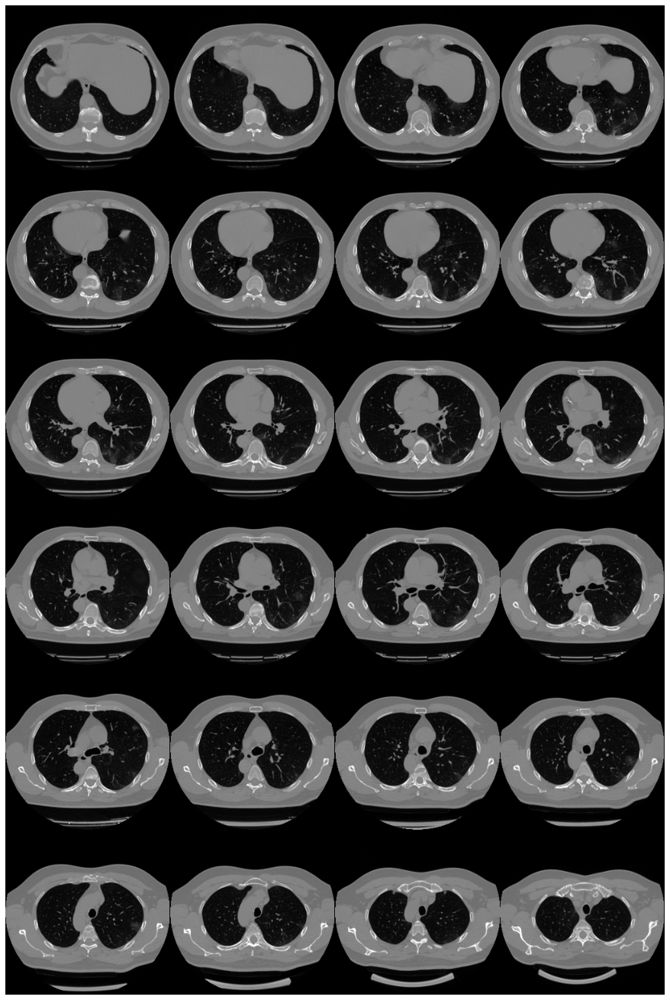

In [79]:
plot_slices(x_val[2], 6, 4, width=256, height=256)

### Ressources supplémentaires

- DLTK : https://github.com/DLTK/DLTK
- Tutoriel du DICOM vers numpy : https://glassboxmedicine.com/2021/02/16/downloading-and-preprocessing-medical-images-in-bulk-dicom-to-numpy-with-python/
